In [1]:
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import statsmodels.api as sm
from IPython.display import Image
from ast import literal_eval
sys.path.append('../')
from advert_conversion_rates import *
from utils.data_processing import process_table
from utils.schedule_processing import consolidate_time_to_30_mins_slot, combine_schedule

pd.set_option("display.max_rows", None)

In [2]:
movie_df = pd.read_csv('../data/movie_database.csv')
channel_0_conversion_rates_df = pd.read_csv('../data/channel_0_conversion_rates.csv', index_col=[0])
channel_0_conversion_rates_df.index = pd.to_datetime(channel_0_conversion_rates_df.index)
channel_1_conversion_rates_df = pd.read_csv('../data/channel_1_conversion_rates.csv', index_col=[0])
channel_1_conversion_rates_df.index = pd.to_datetime(channel_1_conversion_rates_df.index)
channel_2_conversion_rates_df = pd.read_csv('../data/channel_2_conversion_rates.csv', index_col=[0])
channel_2_conversion_rates_df.index = pd.to_datetime(channel_2_conversion_rates_df.index)
channel_a_schedule_df = pd.read_csv('../data/channel_A_schedule.csv', index_col=[0])
channel_a_schedule_df.index = pd.to_datetime(channel_a_schedule_df.index)
channel_0_schedule_df = pd.read_csv('../data/channel_0_schedule.csv', index_col=[0])
channel_0_schedule_df.index = pd.to_datetime(channel_0_schedule_df.index)
channel_1_schedule_df = pd.read_csv('../data/channel_1_schedule.csv', index_col=[0])
channel_1_schedule_df.index = pd.to_datetime(channel_1_schedule_df.index)
channel_2_schedule_df = pd.read_csv('../data/channel_2_schedule.csv', index_col=[0])
channel_2_schedule_df.index = pd.to_datetime(channel_2_schedule_df.index)

In [3]:
movie_df['genres'] = movie_df['genres'].apply(literal_eval)
movie_df['release_date'] = pd.to_datetime(movie_df['release_date'])

In [4]:
def decay(lambda_rate, X):
    return np.exp(-lambda_rate * X)

In [5]:
def decay_view_penelty(view, latest_showing_date, current_date):

    lambda_rate = 1 
    delta_day = (current_date - latest_showing_date).days
    penalty = decay(lambda_rate, delta_day)
    return penalty
    

In [6]:
movie_df = process_table(movie_df)

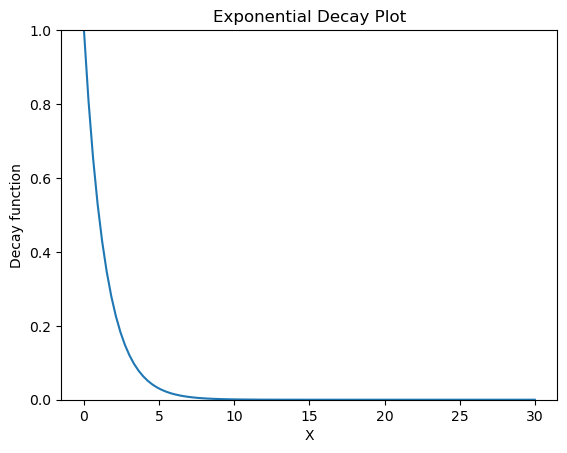

In [7]:
# Define decay function
def decay(lambda_rate, X):
    return np.exp(-lambda_rate * X)

# Parameters
N = 100
X = np.linspace(30, 0, num=N)  # Generates a 1D array
lambda_rate = 0.7

# Calculate decay
ff = decay(lambda_rate, X)

# Plot setup
plt.clf()
axes = plt.axes()
axes.set_ylim([0, 1])
plt.plot(X, ff)
plt.xlabel("X")
plt.ylabel("Decay function")
plt.title("Exponential Decay Plot")
plt.show()

## Dealing with schedule information

In [33]:
channel_a_schedule_df.resample('30min').mean().dropna(axis=0, how='all')

,children_baseline_view_count,adults_baseline_view_count,retirees_baseline_view_count,prime_time_factor
2024-10-01 07:00:00,0.019383,0.022296,0.003611,1.000000
2024-10-01 07:30:00,0.015485,0.022928,0.004694,1.000000
2024-10-01 08:00:00,0.009684,0.024245,0.006021,1.000000
2024-10-01 08:30:00,0.004744,0.026238,0.007612,1.000000
2024-10-01 09:00:00,0.001831,0.028892,0.009478,1.000000
2024-10-01 09:30:00,0.000587,0.032187,0.011623,1.000000
2024-10-01 10:00:00,0.000230,0.036092,0.014033,1.000000
2024-10-01 10:30:00,0.000256,0.040570,0.016682,1.000000
2024-10-01 11:00:00,0.000496,0.045572,0.019525,1.000000
2024-10-01 11:30:00,0.000981,0.051038,0.022498,1.000000


In [30]:
df = df.dropna(axis=0, how='all')

In [31]:
df

,children_baseline_view_count,adults_baseline_view_count,retirees_baseline_view_count,prime_time_factor
2024-10-01 07:00:00,0.019383,0.022296,0.003611,1.000000
2024-10-01 07:30:00,0.015485,0.022928,0.004694,1.000000
2024-10-01 08:00:00,0.009684,0.024245,0.006021,1.000000
2024-10-01 08:30:00,0.004744,0.026238,0.007612,1.000000
2024-10-01 09:00:00,0.001831,0.028892,0.009478,1.000000
2024-10-01 09:30:00,0.000587,0.032187,0.011623,1.000000
2024-10-01 10:00:00,0.000230,0.036092,0.014033,1.000000
2024-10-01 10:30:00,0.000256,0.040570,0.016682,1.000000
2024-10-01 11:00:00,0.000496,0.045572,0.019525,1.000000
2024-10-01 11:30:00,0.000981,0.051038,0.022498,1.000000


In [32]:
df.iloc[34]

children_baseline_view_count    0.019383
adults_baseline_view_count      0.022296
retirees_baseline_view_count    0.003611
prime_time_factor               1.000000
Name: 2024-10-02 07:00:00, dtype: float64

In [10]:
movie_df = process_table(movie_df)
movie_df

,title,vote_average,vote_count,release_date,revenue,runtime,budget,popularity,genres,n_ad_breaks,...,adults_scaled_popularity,retirees_scaled_popularity,license_fee,children_expected_view_count,adults_expected_view_count,retirees_expected_view_count,total_expected_view_count,ad_slot_price,ad_slot_with_viewership,total_time_slots
0,Inception,8.364,34495,2010-07-15,825532764,148,160000000,83.952,"[Action, Science Fiction, Adventure]",5,...,9.720274e-01,3.888110e-01,1.386639e+06,7.776220e-01,9.720274e-01,3.888110e-01,2.138460,277327.863360,5.442212e+05,6.0
1,Interstellar,8.417,32571,2014-11-05,701729206,169,165000000,140.241,"[Adventure, Drama, Science Fiction]",6,...,1.000000e+00,6.000000e-01,1.250075e+06,6.000000e-01,1.000000e+00,6.000000e-01,2.200000,208345.841200,4.206184e+05,7.0
2,The Dark Knight,8.512,30619,2008-07-16,1004558444,152,185000000,130.643,"[Drama, Action, Crime, Thriller]",6,...,1.000000e+00,8.000000e-01,1.661470e+06,6.000000e-01,1.000000e+00,8.000000e-01,2.400000,276911.688800,6.098644e+05,6.0
3,Avatar,7.573,29815,2009-12-15,2923706026,162,237000000,79.932,"[Action, Adventure, Fantasy, Science Fiction]",6,...,9.581994e-01,3.832798e-01,4.089247e+06,7.665595e-01,9.581994e-01,3.832798e-01,2.108039,681541.205200,1.318413e+06,6.0
4,The Avengers,7.710,29166,2012-04-25,1518815515,143,220000000,98.082,"[Science Fiction, Action, Adventure]",5,...,1.000000e+00,4.000000e-01,2.362579e+06,8.000000e-01,1.000000e+00,4.000000e-01,2.200000,472515.723600,9.539370e+05,6.0
5,Deadpool,7.606,28894,2016-02-09,783100000,108,58000000,72.735,"[Action, Adventure, Comedy]",4,...,9.312115e-01,5.587269e-01,1.090920e+06,9.312115e-01,9.312115e-01,5.587269e-01,2.421150,272730.000000,6.059480e+05,4.0
6,Avengers: Infinity War,8.255,27713,2018-04-25,2052415039,149,300000000,154.340,"[Adventure, Action, Science Fiction]",5,...,1.000000e+00,4.000000e-01,3.194898e+06,8.000000e-01,1.000000e+00,4.000000e-01,2.200000,638979.609360,1.290002e+06,6.0
7,Fight Club,8.438,27238,1999-10-15,100853753,139,63000000,69.498,[Drama],5,...,9.179983e-01,9.179983e-01,2.842245e+05,3.671993e-01,9.179983e-01,9.179983e-01,2.203196,56844.900720,1.149279e+05,5.0
8,Guardians of the Galaxy,7.906,26638,2014-07-30,772776600,121,170000000,33.255,"[Action, Science Fiction, Adventure]",5,...,6.845881e-01,2.738352e-01,1.347332e+06,5.476704e-01,6.845881e-01,2.738352e-01,1.506094,269466.384000,3.724237e+05,5.0
9,Pulp Fiction,8.488,25893,1994-09-10,213900000,154,8500000,74.862,"[Thriller, Crime]",6,...,9.395123e-01,7.516099e-01,2.890800e+05,3.758049e-01,9.395123e-01,7.516099e-01,2.066927,48180.000000,9.138454e+04,6.0


## Estimate "Risk" of the actual view

In [11]:
channel_0_schedule_df.columns

Index(['content', 'content_type', 'movie_popularity_factor',
       'children_popularity_factor', 'adults_popularity_factor',
       'retirees_popularity_factor', 'movie_budget', 'box_office_revenue',
       'n_ad_breaks', 'prime_time_factor', 'children_baseline_view_count',
       'children_expected_view_count', 'children_true_view_count_0',
       'children_true_view_count_1', 'children_true_view_count_2',
       'children_true_view_count_3', 'children_true_view_count_4',
       'children_true_view_count_5', 'children_true_view_count_6',
       'children_true_view_count_7', 'children_true_view_count_8',
       'children_true_view_count_9', 'adults_baseline_view_count',
       'adults_expected_view_count', 'adults_true_view_count_0',
       'adults_true_view_count_1', 'adults_true_view_count_2',
       'adults_true_view_count_3', 'adults_true_view_count_4',
       'adults_true_view_count_5', 'adults_true_view_count_6',
       'adults_true_view_count_7', 'adults_true_view_count_8',
   

In [80]:
DEMOGRAPHIC_LIST = ['children', 'adults', 'retirees']
CHANNEL_LIST = ['0', '1', '2']
expected_dict = {}
for demographic in DEMOGRAPHIC_LIST:
    expected_dict[f'{demographic}_name_list'] = [f'{demographic}_true_view_count_{i}' for i in range(10)]
    expected_dict[f'{demographic}_expected_name_list'] = [f'{demographic}_expected_view_count']
    expected_dict[f'{demographic}_true_list'] = channel_0_schedule_df[expected_dict[f'{demographic}_name_list']].to_numpy()
    expected_dict[f'{demographic}_true_list'] = np.append(expected_dict[f'{demographic}_true_list'],
                                                    channel_1_schedule_df[expected_dict[f'{demographic}_name_list']].to_numpy())
    expected_dict[f'{demographic}_true_list'] = np.append(expected_dict[f'{demographic}_true_list'],
                                                    channel_2_schedule_df[expected_dict[f'{demographic}_name_list']].to_numpy())
    expected_dict[f'{demographic}_expected_list'] = channel_0_schedule_df[expected_dict[f'{demographic}_expected_name_list']].to_numpy()
    expected_dict[f'{demographic}_expected_list'] = np.append(expected_dict[f'{demographic}_expected_list'],
                                                             channel_1_schedule_df[expected_dict[f'{demographic}_expected_name_list']].to_numpy())
    expected_dict[f'{demographic}_expected_list'] = np.append(expected_dict[f'{demographic}_expected_list'],
                                                             channel_2_schedule_df[expected_dict[f'{demographic}_expected_name_list']].to_numpy())

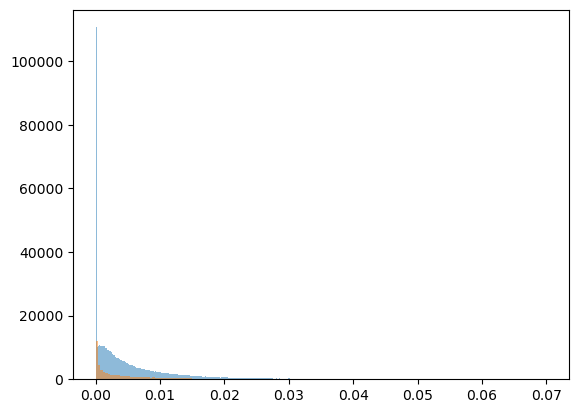

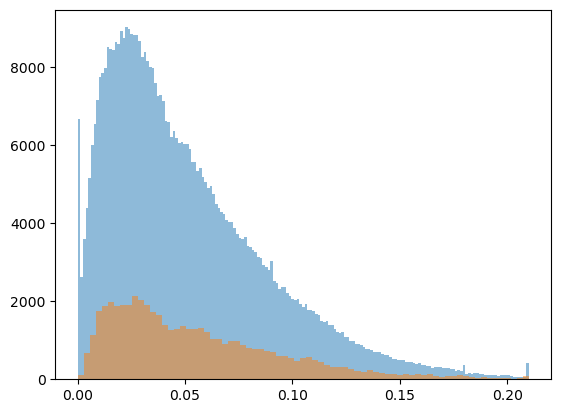

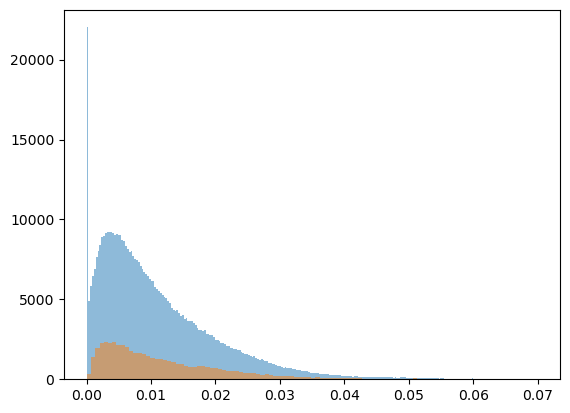

In [53]:
for demographic in DEMOGRAPHIC_LIST:
    plt.hist(expected_dict[f'{demographic}_true_list'], "auto", alpha=0.5, label='true')
    plt.hist(expected_dict[f'{demographic}_expected_list'], "auto", alpha=0.5, label='expected')
    plt.show()

### Calculate Mean SD


In [81]:
channel_df = {}
channel_df['0'] = channel_0_schedule_df
channel_df['1'] = channel_1_schedule_df
channel_df['2'] = channel_2_schedule_df

In [82]:
for demographic in DEMOGRAPHIC_LIST:
    for channel in CHANNEL_LIST:
        expected_dict[f'{demographic}_{channel}_var_true_list'] = channel_df[channel][expected_dict[f'{demographic}_name_list']].apply(np.var, axis=1).to_numpy()
        expected_dict[f'{demographic}_{channel}_mean_true_list'] = channel_df[channel][expected_dict[f'{demographic}_name_list']].apply(np.mean, axis=1).to_numpy()

In [83]:
expected_dict

{'children_name_list': ['children_true_view_count_0',
  'children_true_view_count_1',
  'children_true_view_count_2',
  'children_true_view_count_3',
  'children_true_view_count_4',
  'children_true_view_count_5',
  'children_true_view_count_6',
  'children_true_view_count_7',
  'children_true_view_count_8',
  'children_true_view_count_9'],
 'children_expected_name_list': ['children_expected_view_count'],
 'children_true_list': array([0.00188433, 0.00124653, 0.0039627 , ..., 0.00238759, 0.        ,
        0.0005662 ]),
 'children_expected_list': array([2.63472071e-03, 2.62559191e-03, 2.59838857e-03, ...,
        4.33673855e-05, 3.76455449e-05, 2.46384419e-05]),
 'adults_name_list': ['adults_true_view_count_0',
  'adults_true_view_count_1',
  'adults_true_view_count_2',
  'adults_true_view_count_3',
  'adults_true_view_count_4',
  'adults_true_view_count_5',
  'adults_true_view_count_6',
  'adults_true_view_count_7',
  'adults_true_view_count_8',
  'adults_true_view_count_9'],
 'adults

### Try histrogram of mean - sample mean

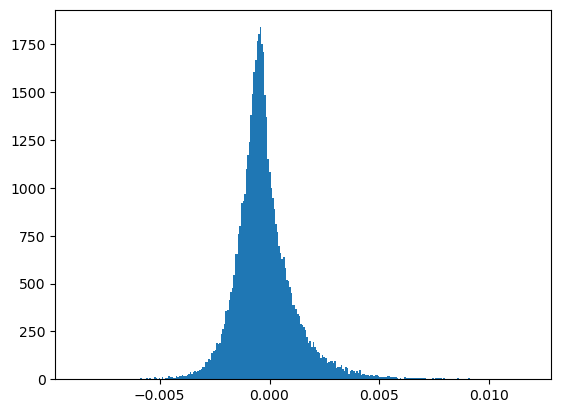

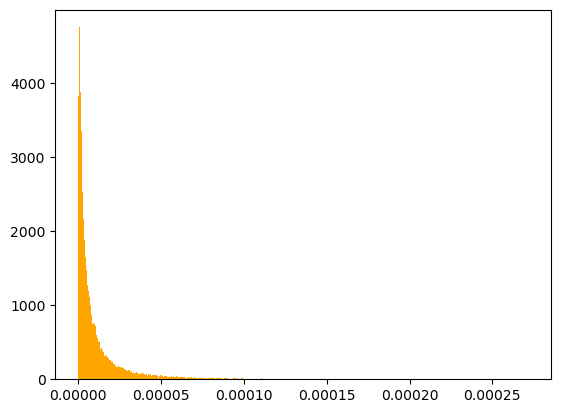

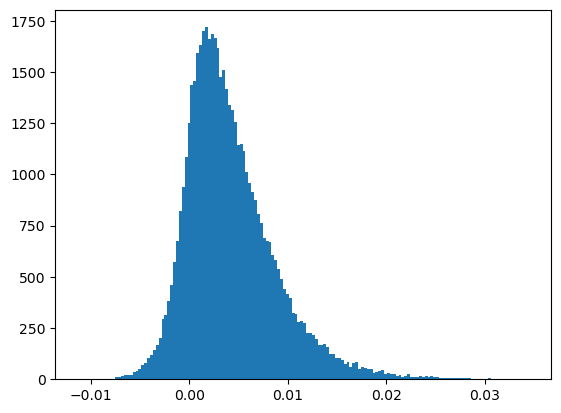

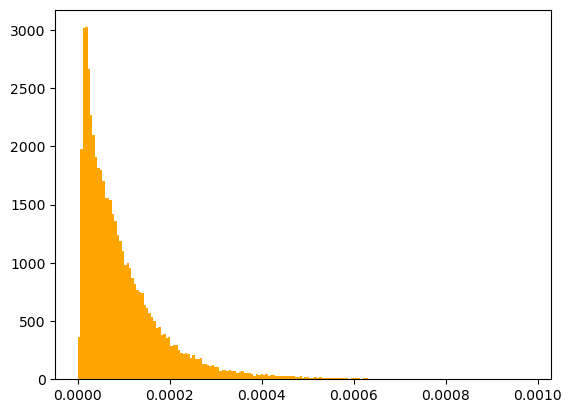

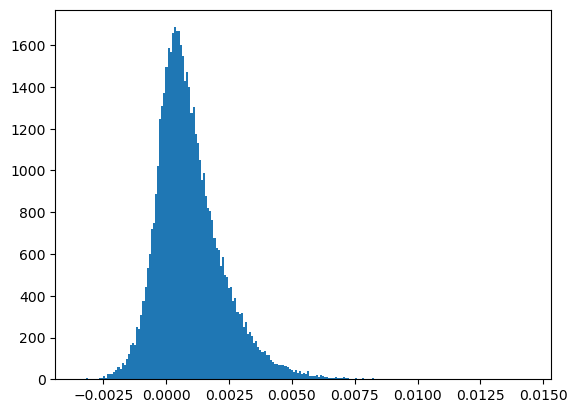

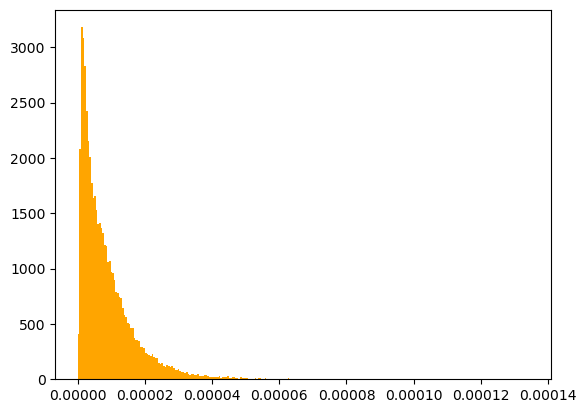

In [72]:
for demographic in DEMOGRAPHIC_LIST:
    delta_mean = expected_dict[f'{demographic}_expected_list'] - expected_dict[f'{demographic}_mean_true_list']
    plt.hist(delta_mean, bins="auto")
    plt.show()
    plt.hist(expected_dict[f'{demographic}_var_true_list'], bins="auto", color="orange")
    plt.show()

### Try to find the variance

array([2.63472071e-03, 2.62559191e-03, 2.59838857e-03, ...,
       1.50962126e-05, 1.31044365e-05, 4.57971514e-05])

In [176]:
for demographic in DEMOGRAPHIC_LIST:
    count = 0
    for channel in CHANNEL_LIST:
        y = expected_dict[f'{demographic}_{channel}_var_true_list']
        X = np.split(expected_dict[f'{demographic}_expected_list'], 3)[count]
        X = sm.add_constant(X)
        model = sm.OLS(y,X)
        results = model.fit()
        print(f'----------------------{demographic}{channel}------------------------------------')
        print(results.params)
        count = count + 1

----------------------children0------------------------------------
[5.86112743e-07 8.76241443e-04]
----------------------children1------------------------------------
[2.59253316e-06 1.64011237e-03]
----------------------children2------------------------------------
[3.10208929e-06 2.10878905e-03]
----------------------adults0------------------------------------
[5.91328244e-06 7.31045279e-04]
----------------------adults1------------------------------------
[2.14504649e-05 1.40227161e-03]
----------------------adults2------------------------------------
[3.49716146e-05 1.60941072e-03]
----------------------retirees0------------------------------------
[9.47692793e-07 2.28749698e-04]
----------------------retirees1------------------------------------
[4.10996265e-06 4.19889254e-04]
----------------------retirees2------------------------------------
[5.42670913e-06 5.53663640e-04]


### Try model the "risk"
Try the N ~ (E(V), E(V)*2*(10^-3)) 

In [191]:
np.sqrt(2*(10**(-2))) * z * 0.001

0.0001812387604873646

In [ ]:
np.sqrt(2*(10**(-3))) * z * 0.001

In [501]:
import scipy.stats as st
percentage = 0.6
z = st.norm.ppf((1+percentage) / 2)
variance_factor = np.sqrt(1.5 * ((10)**(-1)))
def create_upper_lower_bound(expected_view):
    upper = expected_view + (expected_view * z * variance_factor)
    lower = expected_view - (expected_view * z * variance_factor)
    return upper, lower

In [502]:
bounded_dict = {}
for demographic in DEMOGRAPHIC_LIST:
    bounded_dict[f'{demographic}_upper'], bounded_dict[f'{demographic}_lower'] = create_upper_lower_bound(
        expected_dict[f'{demographic}_expected_list'])

###  Test the bound

In [503]:
for demographic in DEMOGRAPHIC_LIST:
    arr = expected_dict[f'{demographic}_true_list'].reshape(-1, 10)
    bounded_dict[f'{demographic}_bound'] = np.logical_and(arr >= bounded_dict[f'{demographic}_lower'].reshape(-1, 1), 
                   arr <= bounded_dict[f'{demographic}_upper'].reshape(-1, 1))

In [504]:
bounded_dict[f'{demographic}_bound']

array([[False, False, False, ..., False, False, False],
       [False, False, False, ...,  True,  True, False],
       [False, False, False, ...,  True, False, False],
       ...,
       [False, False, False, ...,  True, False, False],
       [False,  True, False, ...,  True, False, False],
       [False, False,  True, ..., False, False, False]])

In [505]:
bounded_dict[f'{demographic}_bound'].sum() / bounded_dict[f'{demographic}_bound'].size

0.6648887332710862

### Process schdule

#### No same film in a week

In [445]:
channel_0_schedule_df.index - pd.Timedelta(1, unit='D')

DatetimeIndex(['2024-09-30 07:00:00', '2024-09-30 07:05:00',
               '2024-09-30 07:10:00', '2024-09-30 07:15:00',
               '2024-09-30 07:20:00', '2024-09-30 07:25:00',
               '2024-09-30 07:30:00', '2024-09-30 07:35:00',
               '2024-09-30 07:40:00', '2024-09-30 07:45:00',
               ...
               '2024-12-22 23:10:00', '2024-12-22 23:15:00',
               '2024-12-22 23:20:00', '2024-12-22 23:25:00',
               '2024-12-22 23:30:00', '2024-12-22 23:35:00',
               '2024-12-22 23:40:00', '2024-12-22 23:45:00',
               '2024-12-22 23:50:00', '2024-12-22 23:55:00'],
              dtype='datetime64[ns]', length=17136, freq=None)

In [446]:
def create_week_year(schedule):
    schedule['week'] = (schedule.index - pd.Timedelta(1, unit='D')).isocalendar().week
    schedule['year'] = schedule.index.isocalendar().year
    return schedule

In [447]:
channel_0_schedule_df = create_week_year(channel_0_schedule_df)
channel_1_schedule_df = create_week_year(channel_1_schedule_df)
channel_2_schedule_df = create_week_year(channel_2_schedule_df)
channel_0_unique_week = channel_0_schedule_df.groupby(['week', 'year'])['content'].agg(['unique'])
channel_1_unique_week = channel_1_schedule_df.groupby(['week', 'year'])['content'].agg(['unique'])
channel_2_unique_week = channel_2_schedule_df.groupby(['week', 'year'])['content'].agg(['unique'])

In [448]:
channel_0_unique_week

,,unique
week,year,
40,2024,"[Cop Land, Advert, A Serious Man, Watcher, War..."
41,2024,"[Insidious: The Last Key, Advert, Speed 2: Cru..."
42,2024,"[The Death of Stalin, Advert, A Dog's Journey,..."
43,2024,"[Sing 2, Advert, Kundun, The Blind Side, A Sol..."
44,2024,"[It Chapter Two, Advert, Maps to the Stars, Th..."
45,2024,"[Extreme Ops, Advert, The Glass Castle, Lady i..."
46,2024,"[Advert, Tom & Jerry, Minority Report, Anywher..."
47,2024,"[The Shipping News, Advert, Tenacious D in The..."
48,2024,"[Halloween Kills, Advert, The Rhythm Section, ..."


In [437]:
combine_schedule = []
for week in range(channel_0_unique_week['unique'].size):
    zero_list = channel_0_unique_week['unique'].to_list()[week].tolist()
    one_list = channel_1_unique_week['unique'].to_list()[week].tolist()
    two_list = channel_2_unique_week['unique'].to_list()[week].tolist()
    all_list = list(set(zero_list + one_list + two_list))
    combine_schedule.append(all_list)
    

In [441]:
combine_schedule[0]

['Toy Story',
 'Flipped',
 'Alice in Wonderland',
 'Planes',
 'The Conjuring',
 'Johnny English Strikes Again',
 'Inside Out',
 'Men of Honor',
 'Cop Land',
 'Escape Room: Tournament of Champions',
 'Mission: Impossible - Fallout',
 'The Beach',
 "A Bug's Life",
 'King of Kings',
 'The Sapphires',
 'Man on the Moon',
 'Joker',
 'Fences',
 'Cocktail',
 'Soul Man',
 'Batman Begins',
 'Funny People',
 'Cube',
 'The Little Prince',
 'Atonement',
 'Jeepers Creepers 2',
 'Evil Angels',
 "The King's Man",
 'Alien Resurrection',
 'Queen of the Damned',
 'The Amazing Spider-Man 2',
 'Pacific Rim',
 'J. Edgar',
 'Two Weeks Notice',
 'The Ugly Truth',
 'Snatched',
 'Mommie Dearest',
 'Spartacus',
 'Advert',
 'Teaching Mrs. Tingle',
 'Back to the Future Part III',
 'The Whole Nine Yards',
 'Cry Freedom',
 'The Cable Guy',
 'About Time',
 'Grosse Pointe Blank',
 'The One',
 'Wonder Woman 1984',
 'Obsessed',
 'Three Kings',
 'To Kill a Mockingbird',
 'Platoon',
 'The Secret Life of Pets 2',
 'Morbiu

In [443]:
movie_df

,title,vote_average,vote_count,release_date,revenue,runtime,budget,popularity,genres,n_ad_breaks,...,adults_scaled_popularity,retirees_scaled_popularity,license_fee,children_expected_view_count,adults_expected_view_count,retirees_expected_view_count,total_expected_view_count,ad_slot_price,ad_slot_with_viewership,total_time_slots
0,Inception,8.364,34495,2010-07-15,825532764,148,160000000,83.952,"[Action, Science Fiction, Adventure]",5,...,9.720274e-01,3.888110e-01,1.386639e+06,7.776220e-01,9.720274e-01,3.888110e-01,2.138460,277327.863360,5.442212e+05,6.0
1,Interstellar,8.417,32571,2014-11-05,701729206,169,165000000,140.241,"[Adventure, Drama, Science Fiction]",6,...,1.000000e+00,6.000000e-01,1.250075e+06,6.000000e-01,1.000000e+00,6.000000e-01,2.200000,208345.841200,4.206184e+05,7.0
2,The Dark Knight,8.512,30619,2008-07-16,1004558444,152,185000000,130.643,"[Drama, Action, Crime, Thriller]",6,...,1.000000e+00,8.000000e-01,1.661470e+06,6.000000e-01,1.000000e+00,8.000000e-01,2.400000,276911.688800,6.098644e+05,6.0
3,Avatar,7.573,29815,2009-12-15,2923706026,162,237000000,79.932,"[Action, Adventure, Fantasy, Science Fiction]",6,...,9.581994e-01,3.832798e-01,4.089247e+06,7.665595e-01,9.581994e-01,3.832798e-01,2.108039,681541.205200,1.318413e+06,6.0
4,The Avengers,7.710,29166,2012-04-25,1518815515,143,220000000,98.082,"[Science Fiction, Action, Adventure]",5,...,1.000000e+00,4.000000e-01,2.362579e+06,8.000000e-01,1.000000e+00,4.000000e-01,2.200000,472515.723600,9.539370e+05,6.0
5,Deadpool,7.606,28894,2016-02-09,783100000,108,58000000,72.735,"[Action, Adventure, Comedy]",4,...,9.312115e-01,5.587269e-01,1.090920e+06,9.312115e-01,9.312115e-01,5.587269e-01,2.421150,272730.000000,6.059480e+05,4.0
6,Avengers: Infinity War,8.255,27713,2018-04-25,2052415039,149,300000000,154.340,"[Adventure, Action, Science Fiction]",5,...,1.000000e+00,4.000000e-01,3.194898e+06,8.000000e-01,1.000000e+00,4.000000e-01,2.200000,638979.609360,1.290002e+06,6.0
7,Fight Club,8.438,27238,1999-10-15,100853753,139,63000000,69.498,[Drama],5,...,9.179983e-01,9.179983e-01,2.842245e+05,3.671993e-01,9.179983e-01,9.179983e-01,2.203196,56844.900720,1.149279e+05,5.0
8,Guardians of the Galaxy,7.906,26638,2014-07-30,772776600,121,170000000,33.255,"[Action, Science Fiction, Adventure]",5,...,6.845881e-01,2.738352e-01,1.347332e+06,5.476704e-01,6.845881e-01,2.738352e-01,1.506094,269466.384000,3.724237e+05,5.0
9,Pulp Fiction,8.488,25893,1994-09-10,213900000,154,8500000,74.862,"[Thriller, Crime]",6,...,9.395123e-01,7.516099e-01,2.890800e+05,3.758049e-01,9.395123e-01,7.516099e-01,2.066927,48180.000000,9.138454e+04,6.0


### To do add decay to function